In [ ]:
%load_ext autoreload
%autoreload 2
import os
import pickle as pkl
from typing import Dict, Any
from collections import Counter

import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500) 
pd.set_option('display.max_columns', 50) 
import sklearn as sk
from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, 
    average_precision_score, precision_recall_curve, plot_precision_recall_curve, make_scorer
)
from sklearn.model_selection import KFold, cross_validate, train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 250
import dvu  # for visualization

import imodels

# change working directory to project root
if os.getcwd().split('/')[-1] == 'notebooks':
    os.chdir('../..')

from experiments.models.stablelinear import StableLinearClassifier
from experiments.models.stableskope import StableSkopeClassifier
from experiments.notebooks import viz
from experiments.util import (
    get_comparison_result, get_openml_dataset, get_clean_dataset, 
    get_best_model_under_complexity, MODEL_COMPARISON_PATH
)

np.random.seed(0)

In [ ]:
# from experiments.config.ensemble_config import get_weak_learner_inst_list

In [3]:
# wl_list = get_weak_learner_inst_list([8])[0]

In [4]:
# del wl_list[2]
# wl_list

In [5]:
# np.random.seed(0)
# x, y, feat_names = get_clean_dataset('experiments/data/compas-analysis/compas_two_year_clean.csv')
# xtrain, xtest, ytrain, ytest = sk.model_selection.train_test_split(x, y, test_size=0.2, random_state=0)
# m = imodels.BayesianRuleListClassifier()
# m.fit(xtrain, ytrain)

# print(m.rules_)

# ms = []
# for m in [imodels.SkopeRulesClassifier(n_estimators=90, max_depth=2, max_samples=0.8, max_samples_features=s) for s in [0.2, 0.4, 0.6, 0.8, 1.0]]:
# m = imodels.RuleFitClassifier(n_estimators=100, include_linear=False, alpha=30, max_rules=None) #max_depth=1)
# m = imodels.FPLassoClassifier(minsupport=0.1, disc_strategy='simple', 
#                               disc_kwargs={'strategy':'quantile', 'n_bins': 3}, 
#                               include_linear=False, alpha=1, max_rules=None)
# ms.append(m)
# m = StableLinearClassifier(
#     weak_learners=wl_list,
#     max_complexity = 6,
#     alpha = 5,
#     min_mult = 0,
#     penalty = 'l1',
#     max_rules = None,
#     include_linear = False)
# m = StableSkopeClassifier(
#     weak_learners=wl_list,
#     max_complexity = 6,
#     min_mult = 2,
#     precision_min=0.3,
#     recall_min=0)
# m = imodels.FPLassoClassifier(alpha=398.1071705534969, disc_strategy='simple',
#                    max_rules=None, maxcardinality=1, include_linear = False)
# m = imodels.BayesianRuleListClassifier(max_iter=100, disc_strategy='simple')
# m = imodels.BoostedRulesClassifier(n_estimators=1)
# m.fit(xtrain, ytrain, feature_names=feat_names)

In [6]:
# m.rules_

In [7]:
# m._get_complexity()

In [8]:
# print(roc_auc_score(ytest, m.predict_proba(xtest)[:, 1]))
# print(accuracy_score(ytest, m.predict(xtest)))

In [9]:
# df = get_comparison_result(MODEL_COMPARISON_PATH, 'fpskope', 'cv')['df']
# df

In [10]:
# get_comparison_result(MODEL_COMPARISON_PATH, 'brl', 'val')['df']
# df = pkl.load(open('experiments/comparison_data/reg_data/easy/val/stbl_l2_comparisons.pkl', 'rb'))['df']


In [11]:
# get_comparison_result(MODEL_COMPARISON_PATH, 'fplasso', 'test', easy=True)['rule_df']

# validation plots - hard datasets

## single validation set

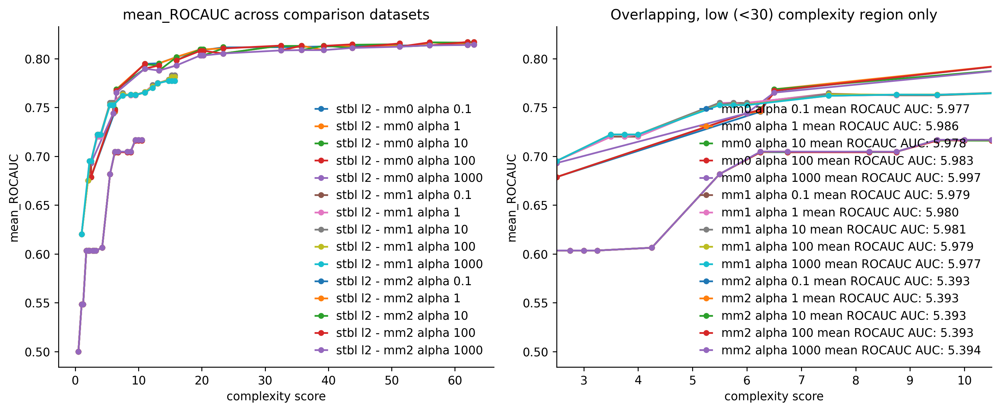

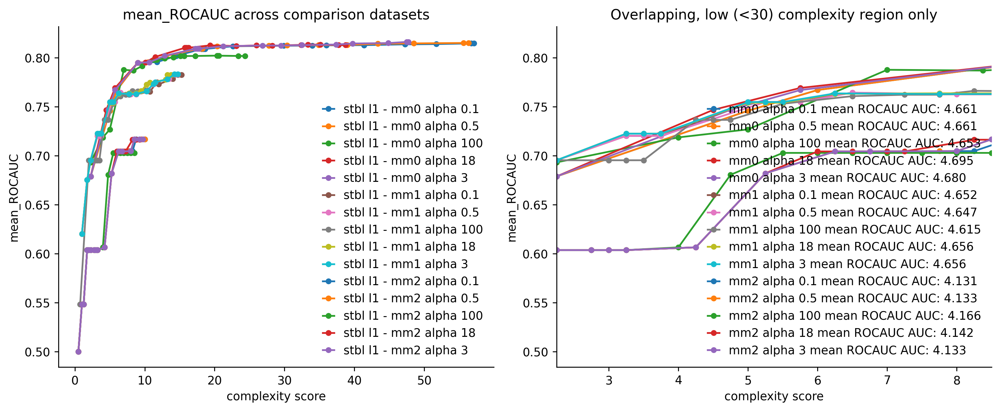

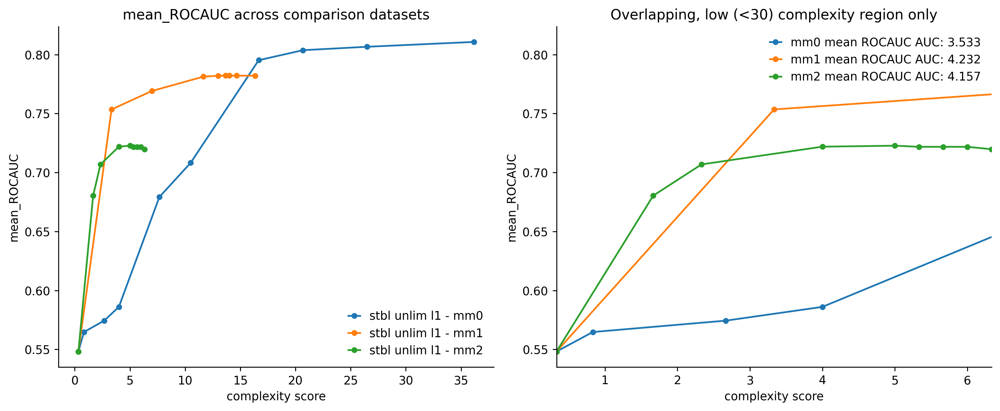

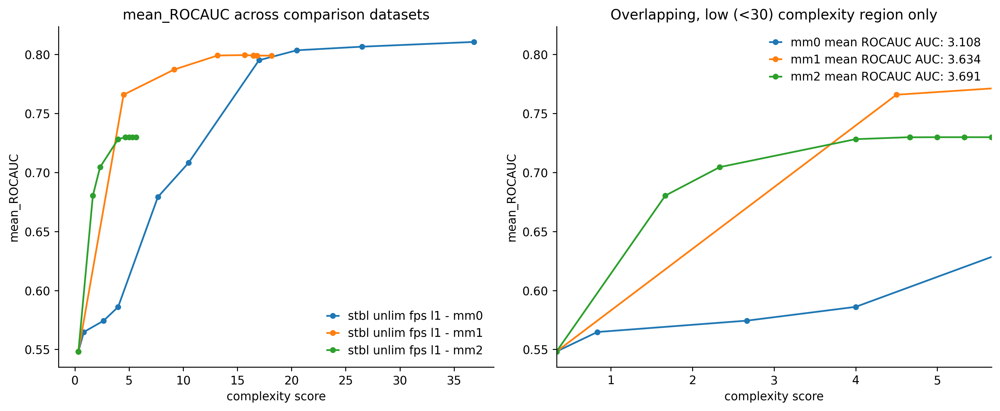

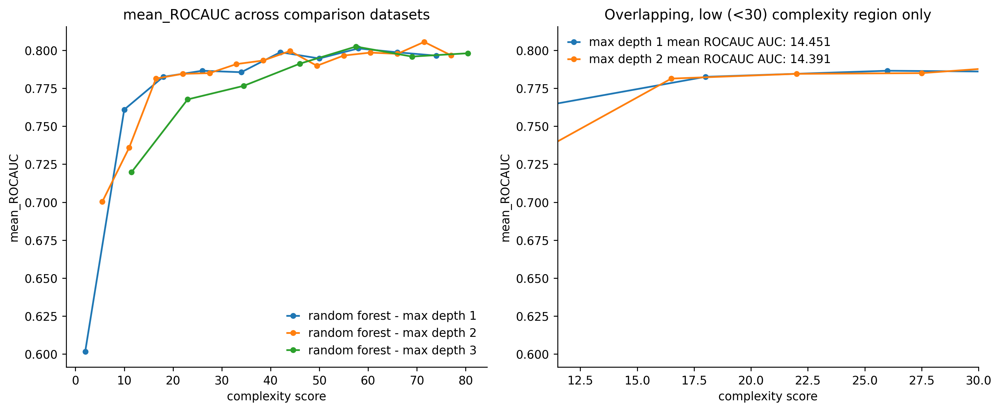

...

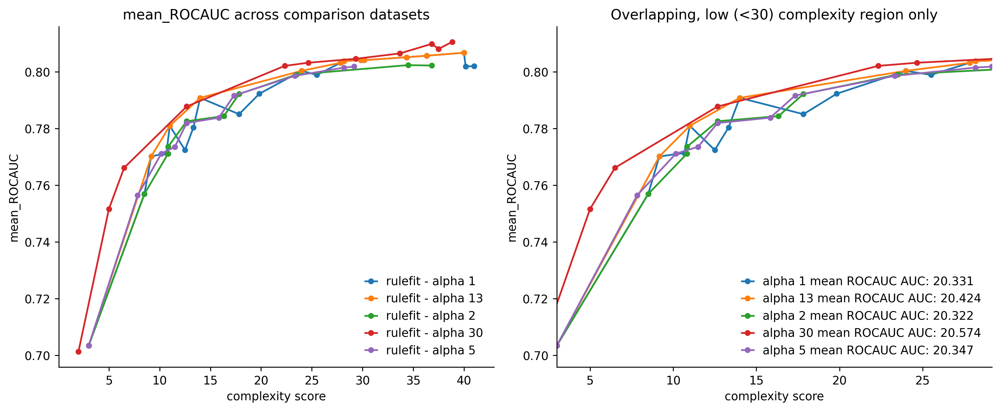

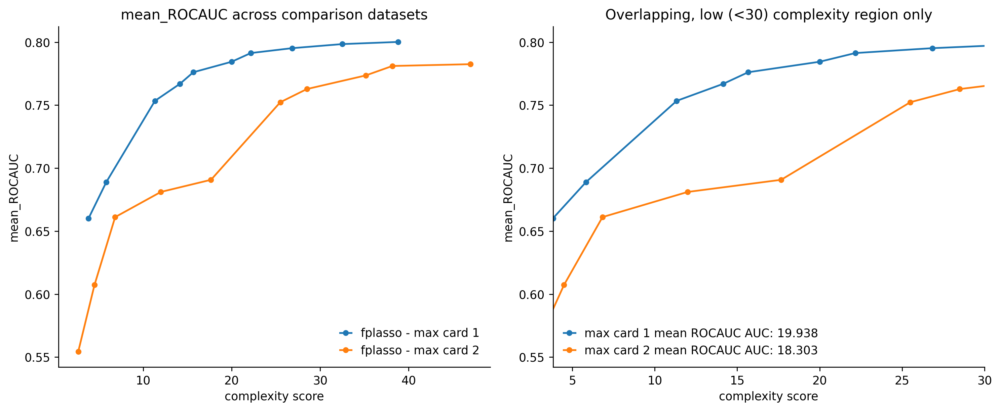

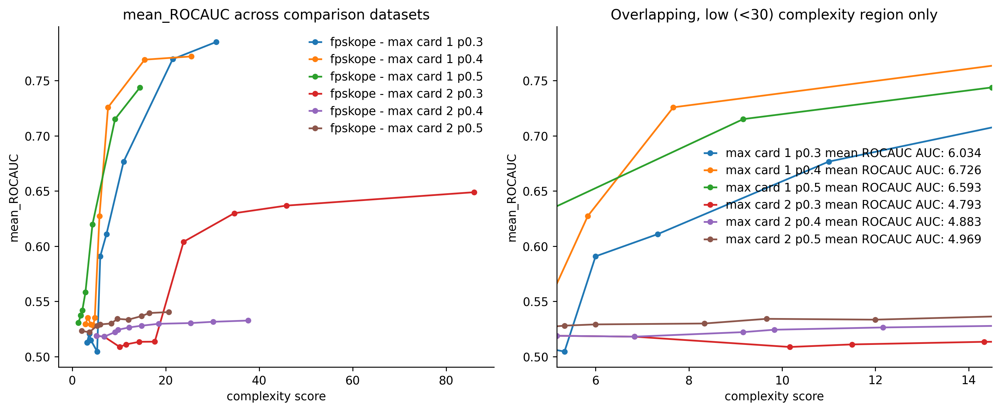

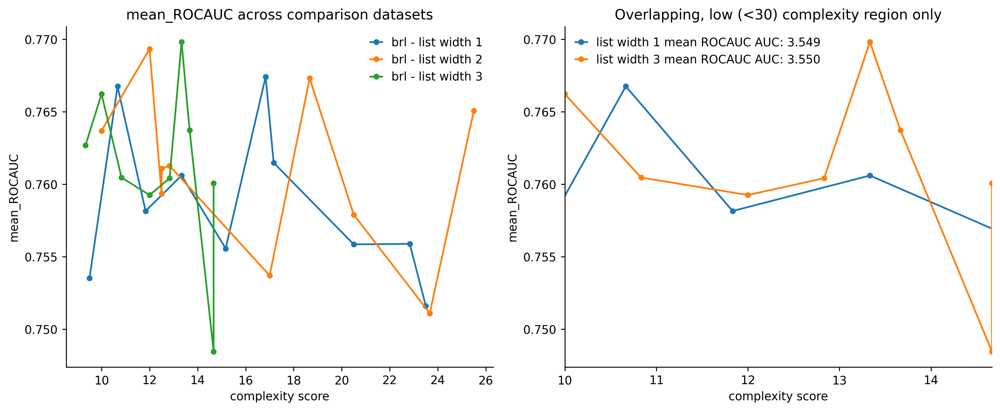

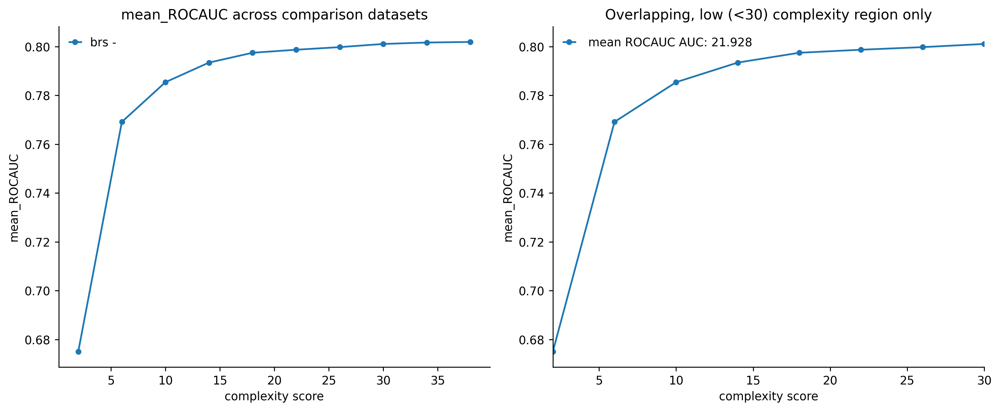

In [12]:
val_models = ['stbl_l2', 'stbl_l1', 'stbl_unlim_l1', 'stbl_unlim_fps_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname) for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

## cross validation

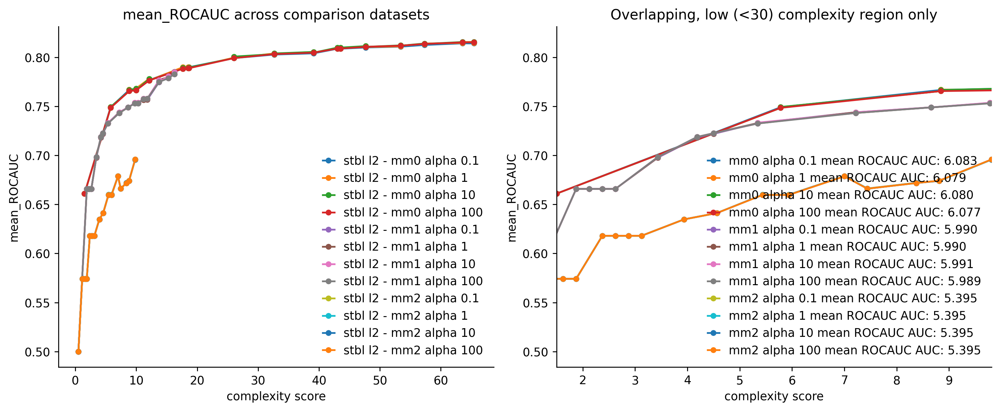

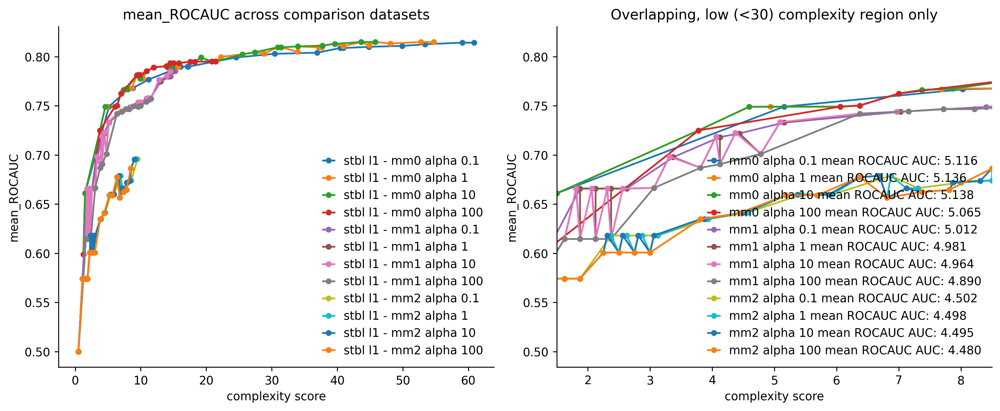

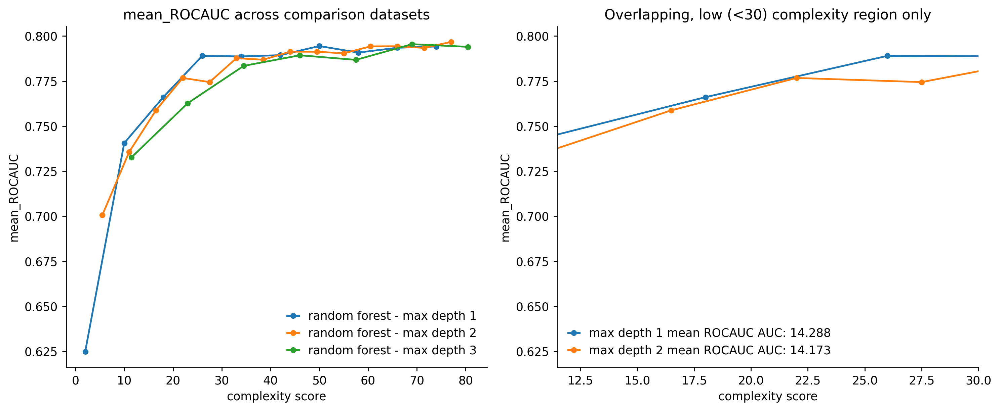

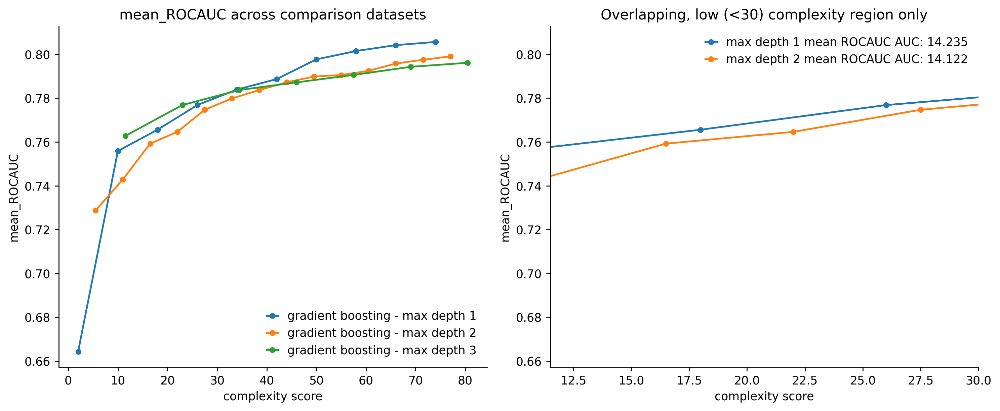

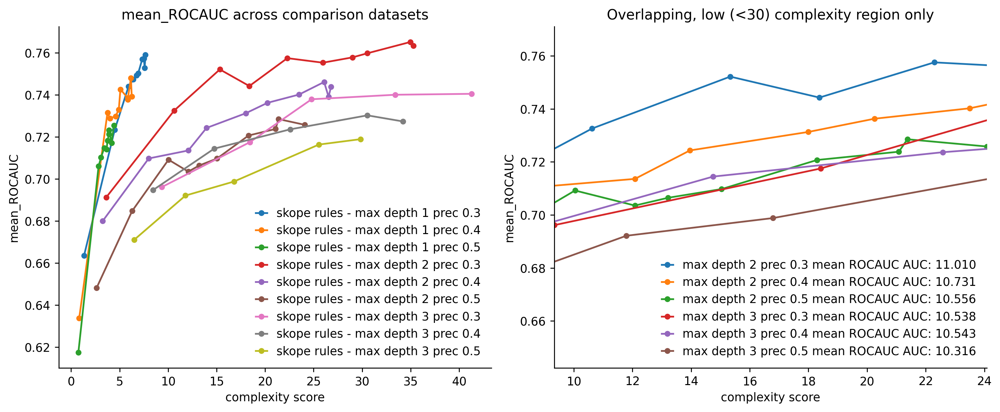

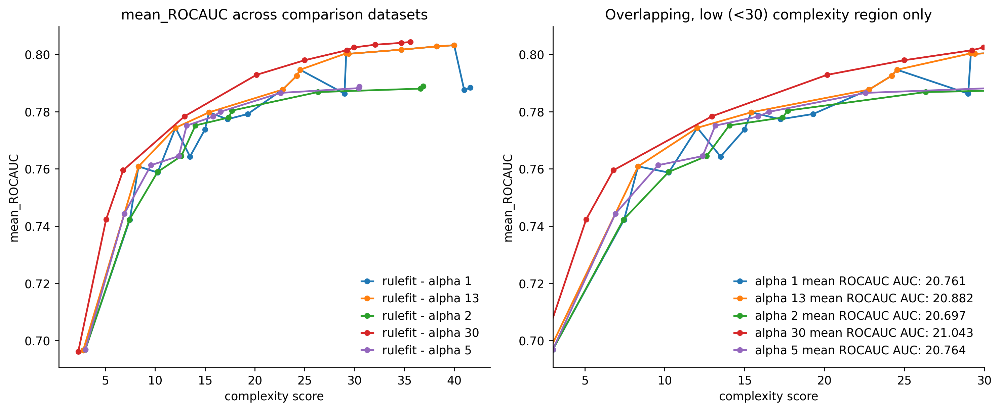

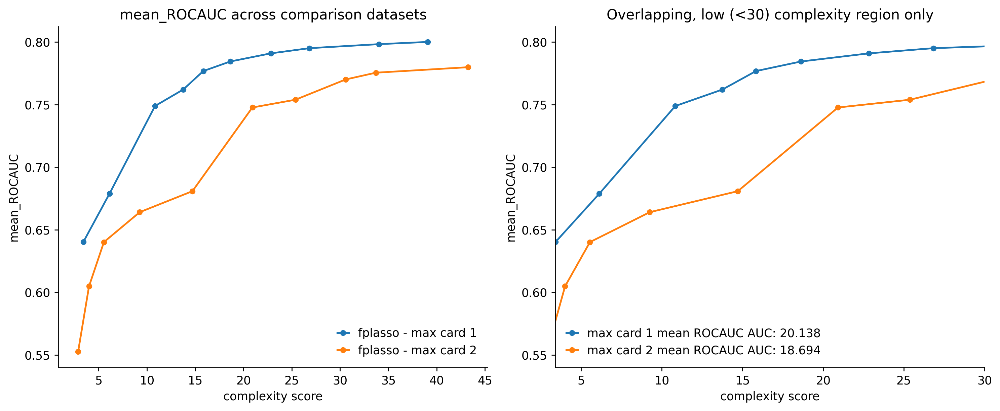

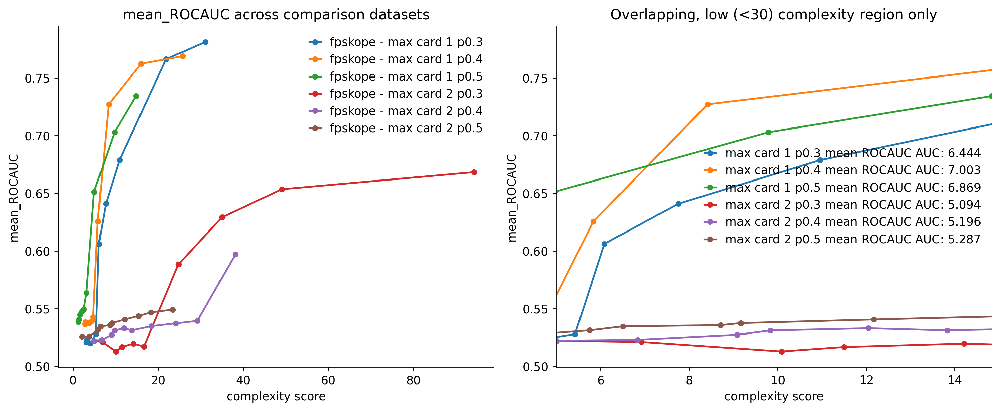

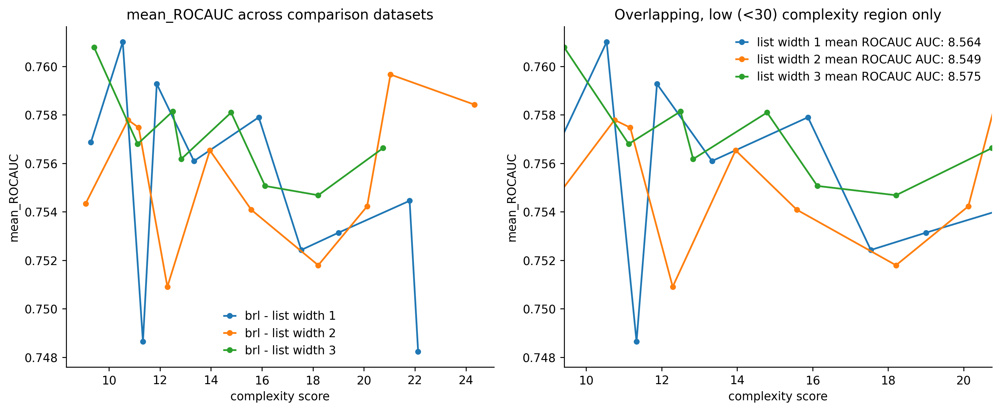

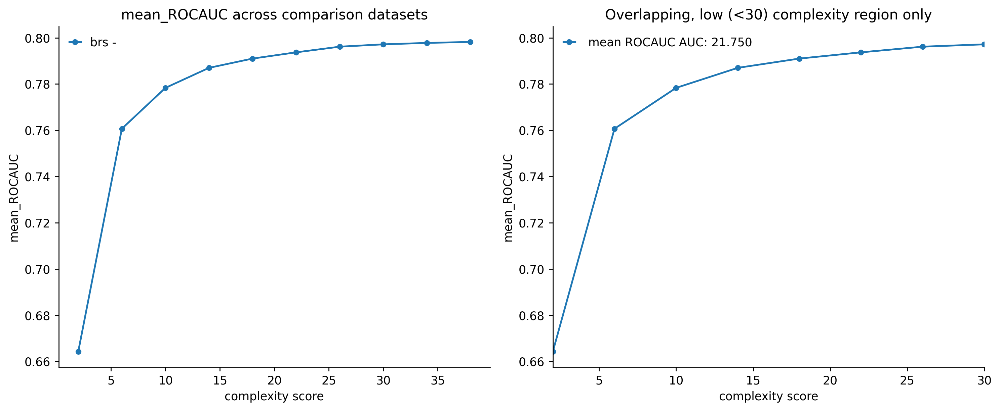

In [13]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, prefix='cv') for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

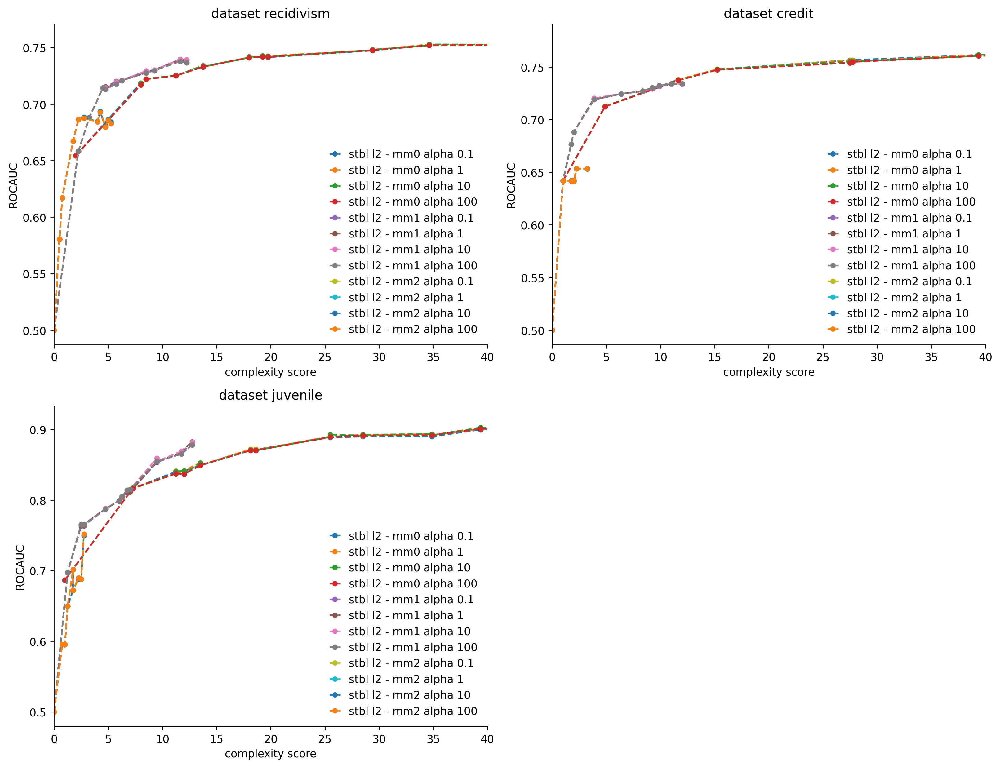

In [14]:
viz.viz_comparison_datasets(val_results[0], 'ROCAUC', cols=2, figsize=(13, 10), datasets=['recidivism', 'credit', 'juvenile'], test=False)
plt.show()

# validation plots - easy datasets

## single validation set

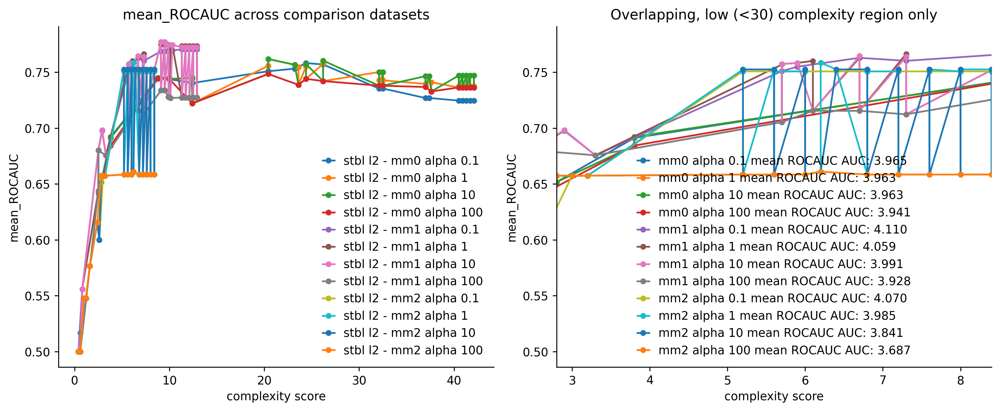

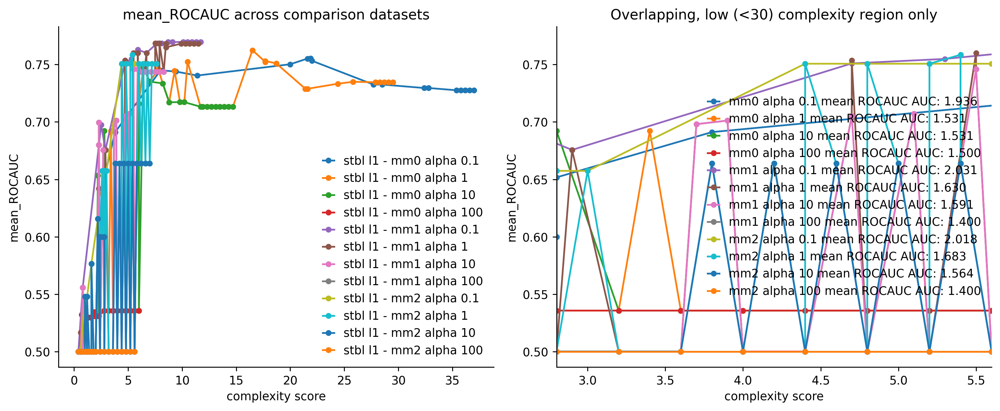

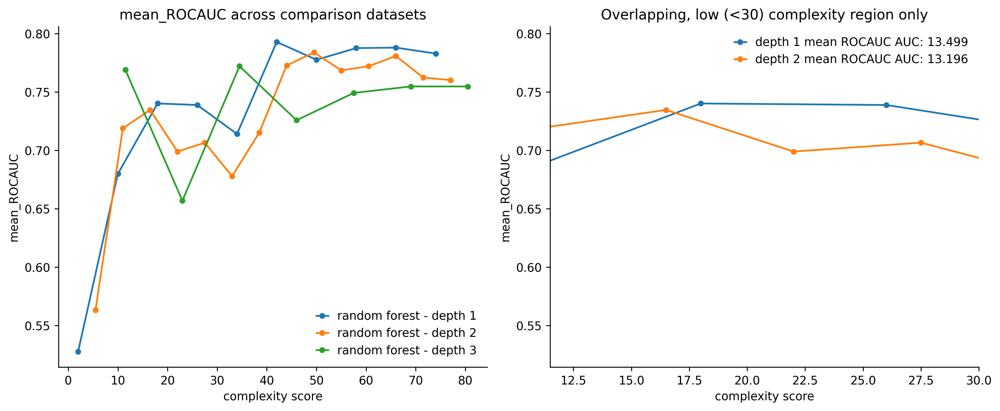

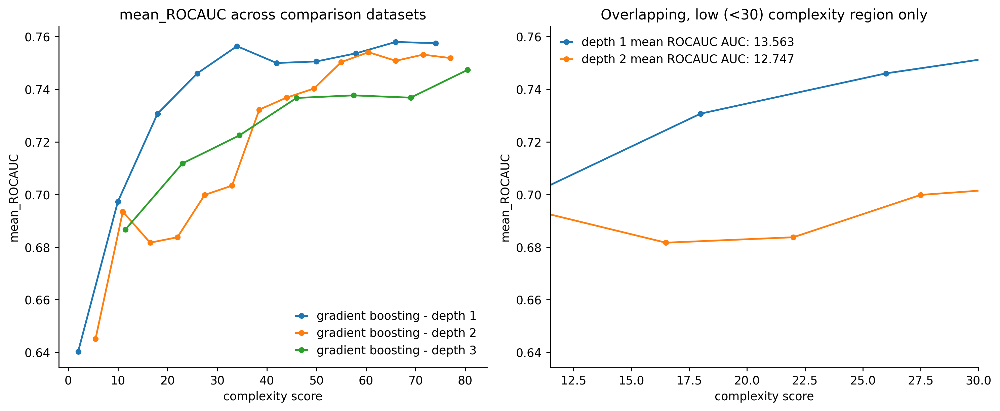

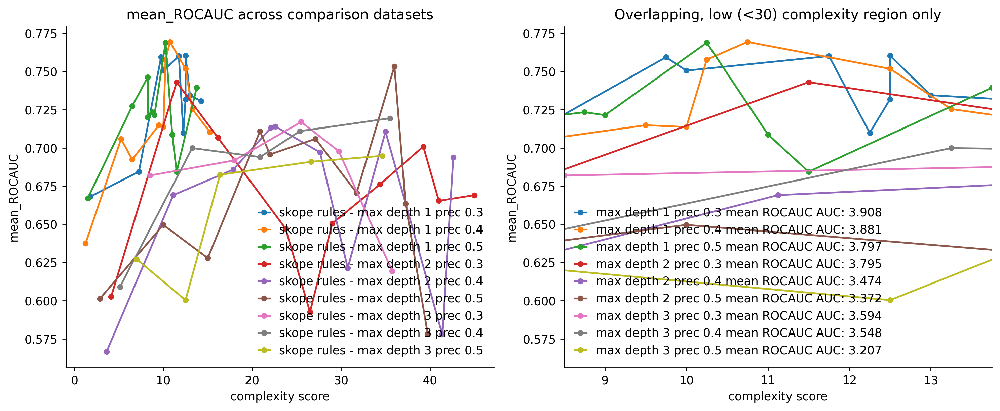

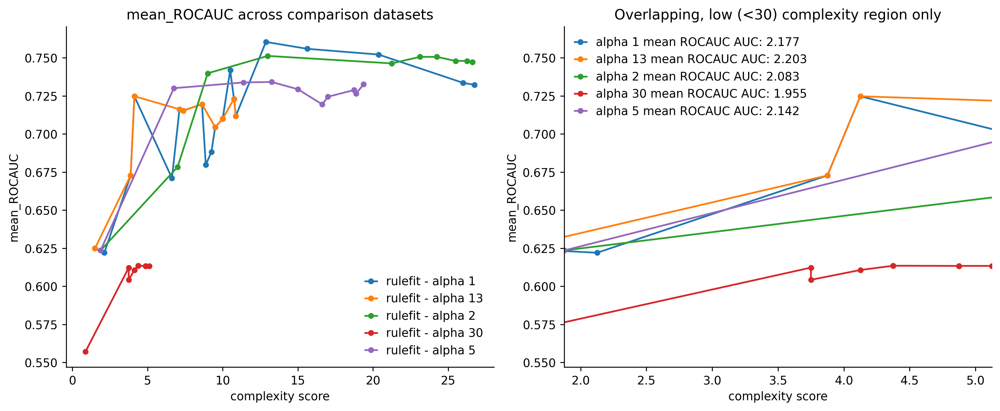

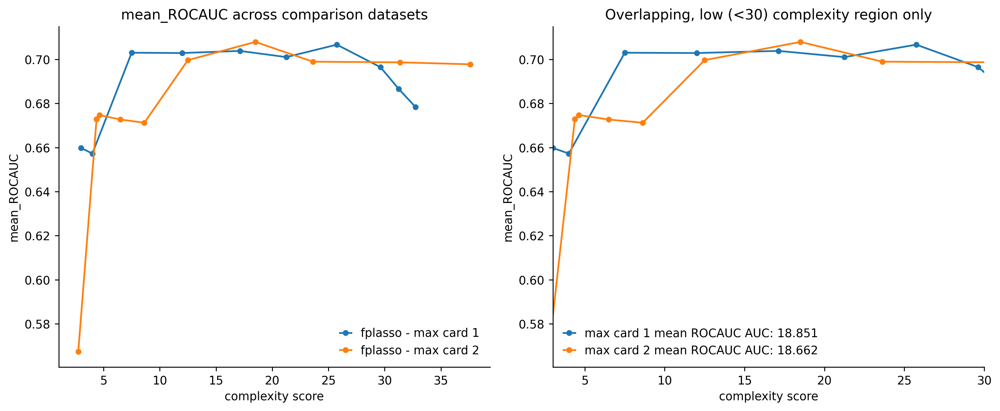

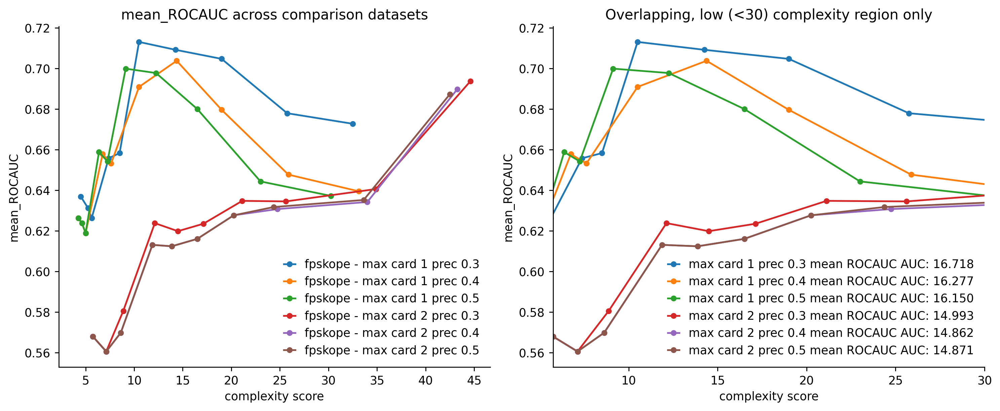

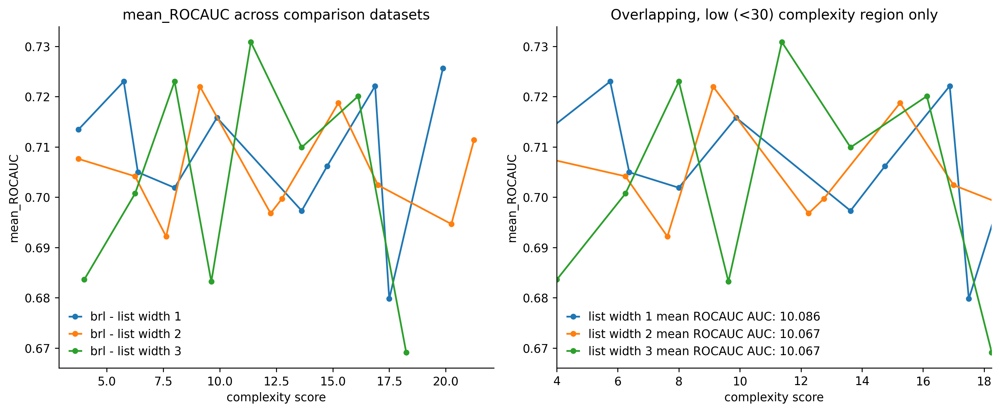

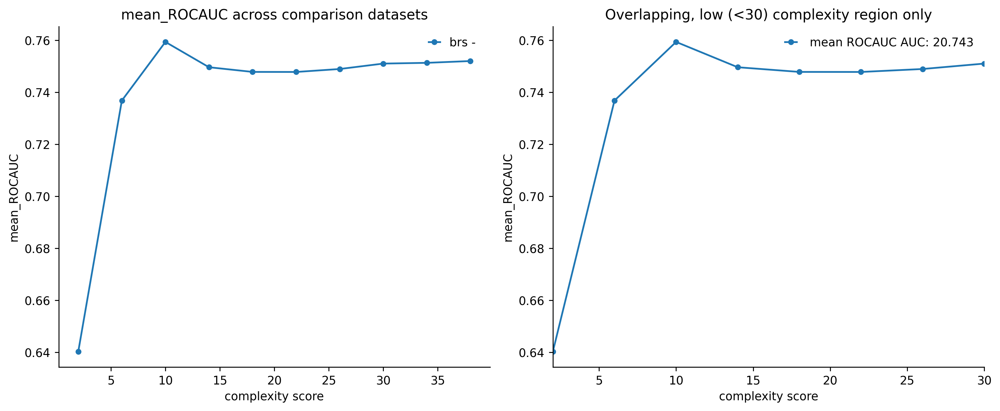

In [15]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, easy=True) for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

## cross validation

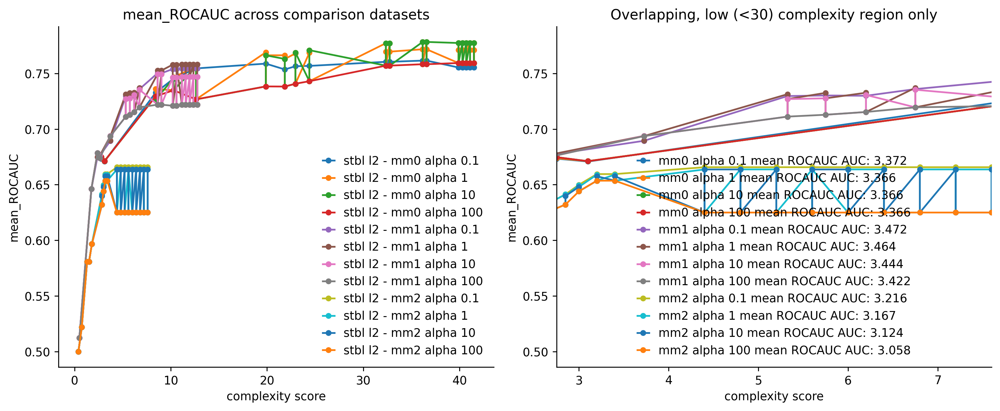

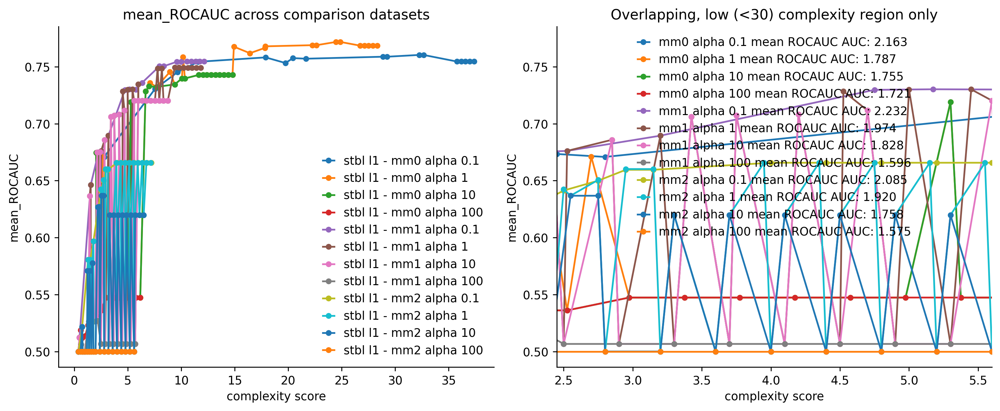

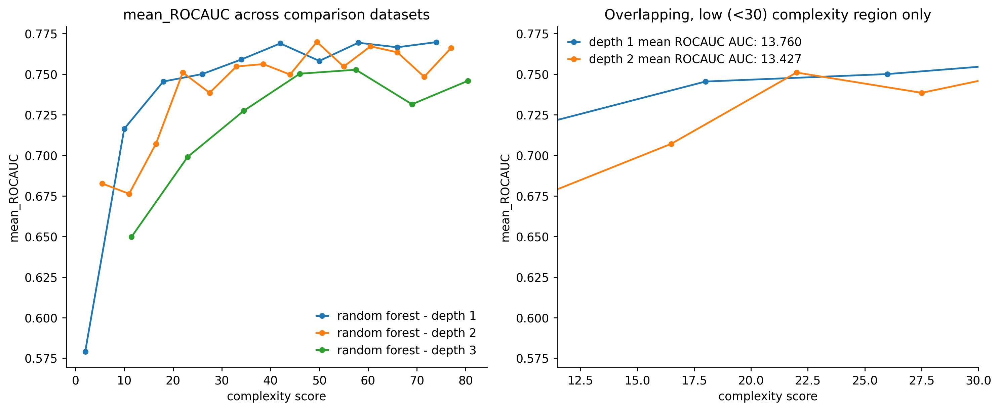

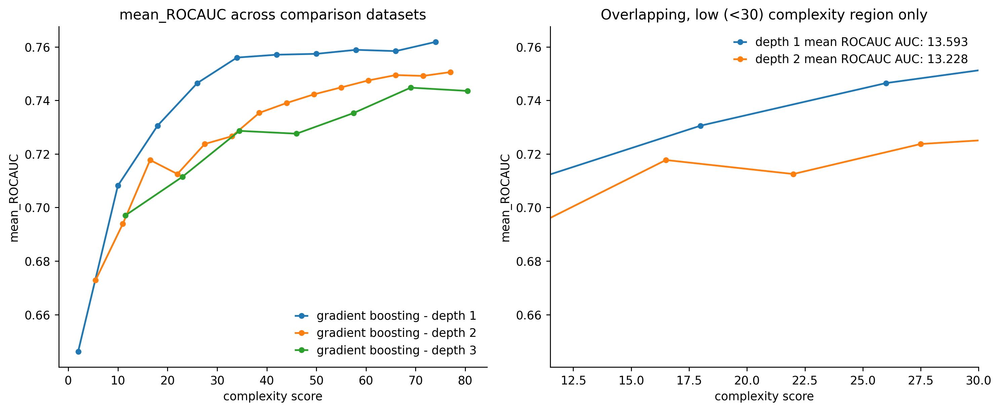

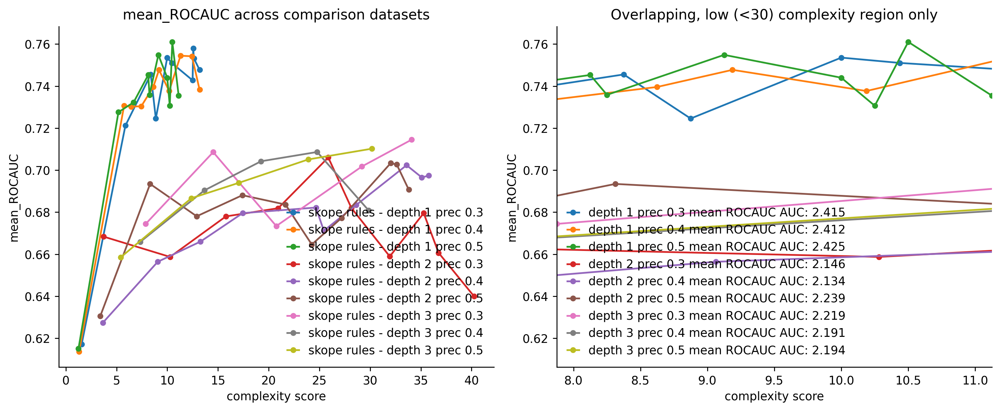

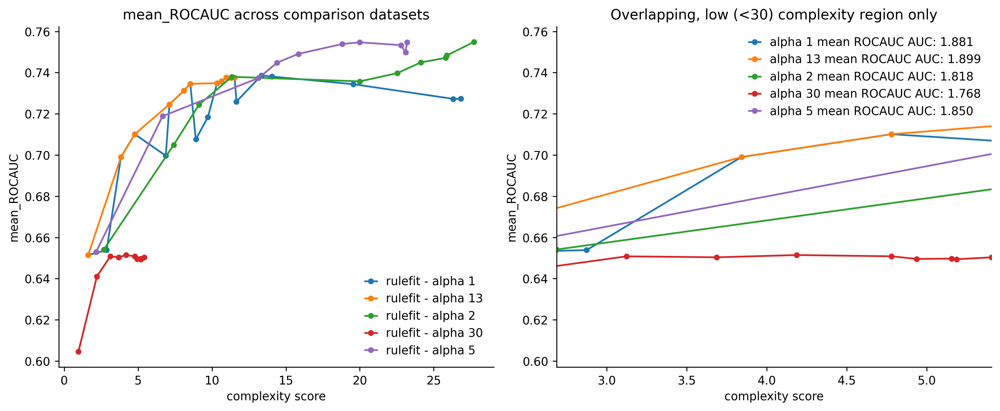

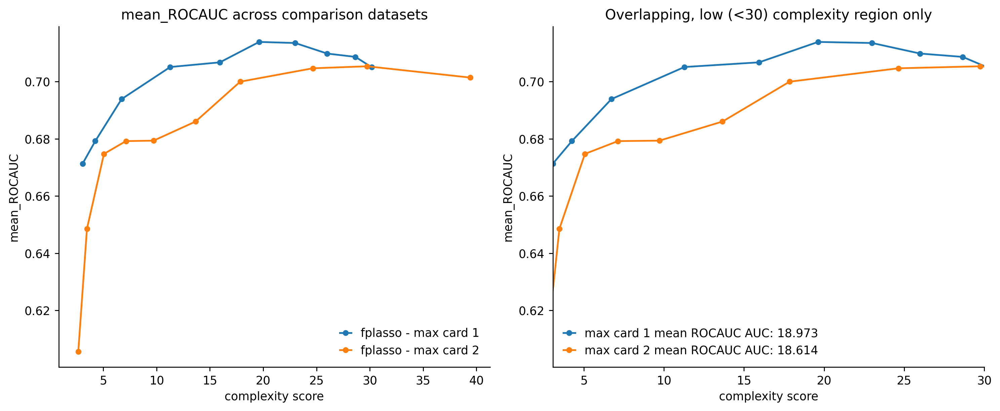

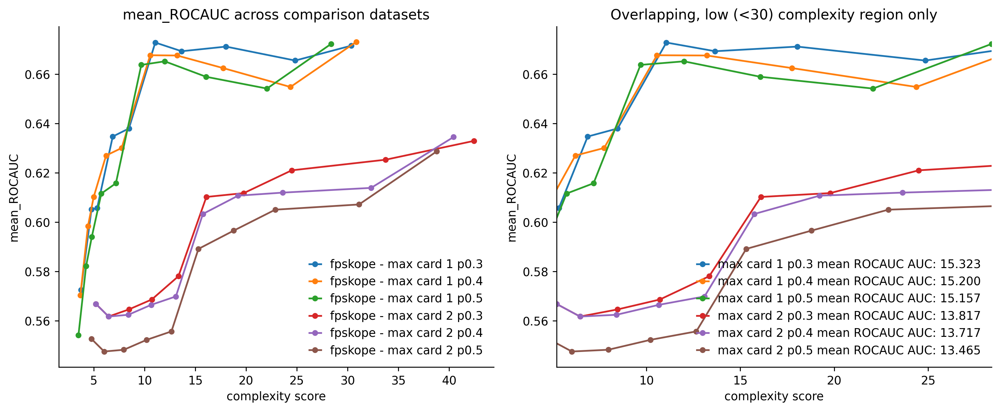

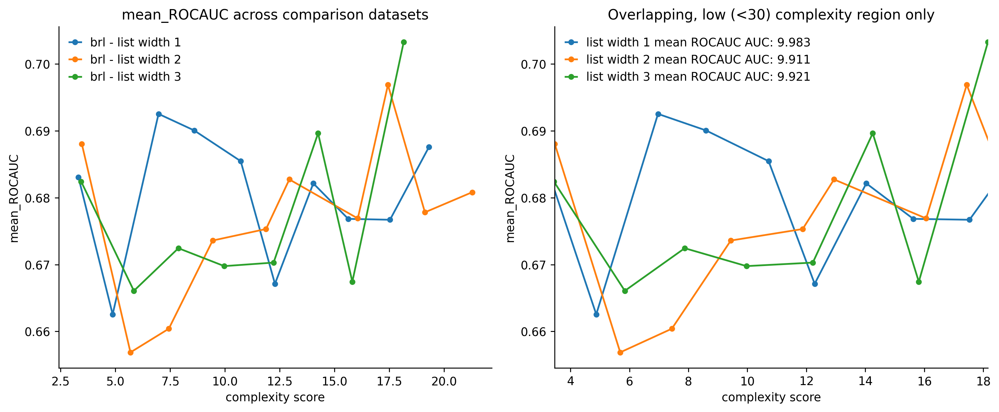

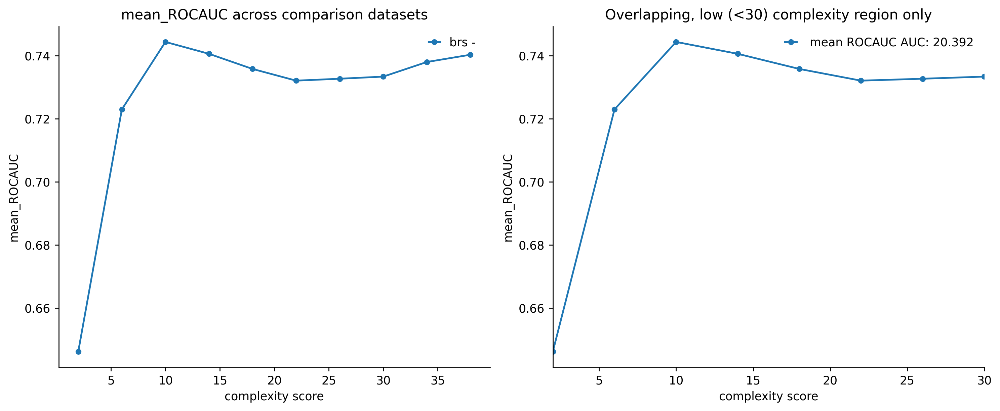

In [16]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, prefix='cv', easy=True) for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

In [17]:
# get_best_model_under_complexity(5, 
#                                 model_name='brl', 
#                                 model_cls=imodels.BayesianRuleListClassifier, 
#                                 curve_param=1,
#                                 metric='mean_ROCAUC',
#                                 easy=True).__str__()
#                                 #kwargs = {'include_linear': False, 'random_state': 0, 'max_rules': None},)

In [18]:
# from slurmpy import Slurm
# partition = 'high'
# s = Slurm("compare_models", {"partition": partition})

# for i in range(36):    
#     s.run(f'python experiments/compare_models.py --model stbl_l1 --parallel_id {i*6} {(i+1)*6 - 1} --ensemble --datasets easy --ignore_cache --cv')
#     s.run(f'python experiments/compare_models.py --model stbl_l2 --parallel_id {i*6} {(i+1)*6 - 1} --ensemble --datasets easy --ignore_cache --cv')

# for i in range(18):
#     s.run(f'python experiments/compare_models.py --parallel_id {i} --ensemble --datasets easy --ignore_cache --test --low_data')

# s.run('python experiments/compare_models.py --model rulefit --test --ignore_cache --low_data')

# for i in range(4):
#     print(f'python experiments/compare_models.py --model stbl_l1 --parallel_id {i*54} {(i+1)*54 - 1} --ignore_cache --datasets easy')
#     print(f'python experiments/compare_models.py --model stbl_l2 --parallel_id {i*54} {(i+1)*54 - 1} --ignore_cache --datasets easy')

In [19]:
# s.run('python experiments/compare_models.py --test --ignore_cache --low_data')

In [20]:
# s.run('python experiments/compare_models.py --test --ensemble --ignore_cache')

In [21]:
# !python experiments/compare_models.py --test --ensemble --ignore_cache --datasets easy